In [1]:
import requests
import urllib3
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
import pandas as pd
from itertools import islice
import polyline
from datetime import datetime, timezone, timedelta

In [2]:
#@title Token

urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

auth_url = "https://www.strava.com/oauth/token"

payload = {
    'client_id': "58702",
    'client_secret': "4587d36c9d9c3e741d121cec1e0dad8819ea200d",
    'refresh_token': "bec22f0640962fb104556a0ecfedea5a949302ad",
    'grant_type': 'refresh_token',
    'f': 'json'
}
res = requests.post(auth_url, data=payload, verify=False)
access_token = res.json()['access_token']

activities_url = "https://www.strava.com/api/v3/athlete/activities?access_token="+access_token

all_activities=[]

In [3]:
pagenum = 1
while True:
    param = {'per_page': 200, 'page': pagenum}
    my_dataset = requests.get(activities_url, params=param).json()
    if len(my_dataset) == 0:
        print("breaking out of while loop")
        break
    if all_activities:
        all_activities.extend(my_dataset)
    else:
        all_activities = my_dataset
    pagenum += 1
print(len(all_activities))

breaking out of while loop
2840


In [4]:
all_activities[0]['start_latlng']

[37.677528, -122.157272]

In [5]:
latbound = 0.5
lonbound = 0.5

filtered_activities = [
    activity for activity in all_activities 
    if activity['start_latlng'] and len(activity['start_latlng']) >= 2
    and activity['start_latlng'][0] > 38.5-latbound 
    and activity['start_latlng'][0] < 38.5+latbound
    and activity['start_latlng'][1] < -121.7+lonbound
    and activity['start_latlng'][1] > -121.7-lonbound 
]

print(f"Found {len(filtered_activities)} activities within latitude bounds")

Found 1042 activities within latitude bounds


In [6]:
coordinate_list = []
for i in range(len(filtered_activities)):
    coordinates = filtered_activities[i]['map']['summary_polyline']
    coordinate_list.append(coordinates)

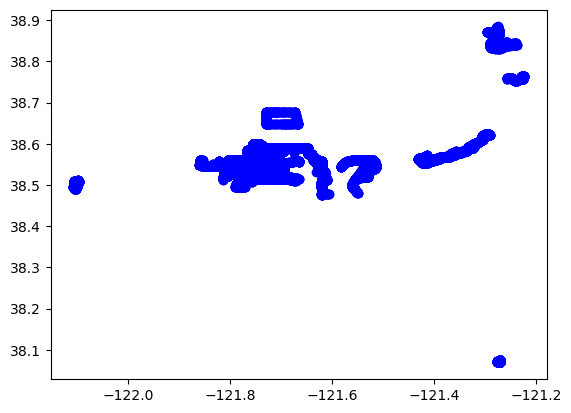

In [7]:
for i in range(len(coordinate_list)):
    coordinates = coordinate_list[i]
    coordinate = polyline.decode(coordinates)
    lats, lons = zip(*coordinate)
    plt.plot(lons, lats, marker='o', color='blue')

    
plt.show()

In [11]:
import folium
from folium.plugins import HeatMap

In [38]:
all_coordinates = []
for coordinates in coordinate_list:
    if coordinates:  # Check if coordinates exist
        decoded_coords = polyline.decode(coordinates)
        # Convert to [lat, lon] format for foliumx
        for lat, lon in decoded_coords:
            all_coordinates.append([lat, lon])

# Create a map centered on Davis area
m = folium.Map(
    location=[38.5, -121.7],  # Davis
    zoom_start=10,
    tiles='OpenStreetMap'
)

# Add heatmap layer
HeatMap(
    all_coordinates,
    radius=15,
    blur=5,
    max_zoom=13
).add_to(m)

m.save("map.html")

In [35]:
def create_polyline_map(activities, output_file="polyline_map.html"):
    """
    Create a map with semi-transparent polylines for each activity.
    This method handles zoom levels gracefully and shows route density.
    """
    
    # Create a map centered on Sacramento area
    m_polyline = folium.Map(
        location=[38.5, -121.7],  # Sacramento area
        zoom_start=10,
        tiles="Cartodb dark_matter"
    )

    # Extract polyline coordinates from activities
    coordinate_list = []
    for activity in activities:
        if 'map' in activity and 'summary_polyline' in activity['map']:
            coordinates = activity['map']['summary_polyline']
            if coordinates:  # Ensure polyline is not empty
                coordinate_list.append(coordinates)

    print(f"Drawing {len(coordinate_list)} routes as polylines.")

    # Add each route as a semi-transparent polyline
    for encoded_polyline in coordinate_list:
        decoded_coords = polyline.decode(encoded_polyline)
        
        folium.PolyLine(
            locations=decoded_coords,
            color='violet',
            weight=1,
            opacity=0.03  
        ).add_to(m_polyline)

    m_polyline.save(output_file)
    print(f"Polyline map saved as '{output_file}'")

In [36]:
create_polyline_map(filtered_activities)

Drawing 1042 routes as polylines.
Polyline map saved as 'polyline_map.html'


In [43]:
startlist = []
for i in range(len(filtered_activities)):
    dot = filtered_activities[i]['start_latlng']
    startlist.append(dot)
    
dotmap = folium.Map(
    location=[38.5, -121.7],  # Davis
    zoom_start=10,
    tiles='Cartodb dark_matter'
)

def plotDot(coords):
    folium.Circle(location=[coords[0], coords[1]],
                        radius=100, weight=1, fill=True).add_to(dotmap)
    

for i in range(len(startlist)):
    plotDot(startlist[i])

dotmap.save("start_dot_map.html")

In [44]:
from folium.plugins import TimestampedGeoJson

In [67]:
def dict_format(activities):
    lines = []
    coordinate_list = []
    for i in range(len(activities)):
        coords = activities[i]['map']['summary_polyline']
        coordinate_list.append(coords)
        
    for i in range(len(coordinate_list)):
        coordinates = []
        for j in range(len(coordinate_list[i])):
            single = []
            newcoords=polyline.decode(coordinate_list[i])
            single.append(newcoords[j][0])
            single.append(newcoords[j][1])
            coordinates.append(single)
        for k in range(len(coordinates)):
            timebins = []
            starttime = activities[k]['start_date_local']
            start_time = datetime.strptime(starttime, "%Y-%m-%dT%H:%M:%SZ")
            end_time = start_time + timedelta(seconds=activities[k]['elapsed_time'])
            endtime = end_time.strftime("%Y-%m-%dT%H:%M:%SZ")
            total_duration = (end_time - start_time).total_seconds()
            x = len(coordinates)
            interval = total_duration / (x - 1)
            timebins = [(start_time + timedelta(seconds=interval * i)).strftime("%Y-%m-%dT%H:%M:%SZ") for i in range(x)]

    lines.append({
        'coordinates': [[lon, lat] for lat, lon in decoded_coords],
        'dates': timebins,
        'color': 'violet',  
        'weight': 3
    })
    return lines
    

In [85]:
from datetime import datetime, timedelta
import polyline

def dict_format1(activities):
    """
    Processes a list of Strava activities to create a format suitable for 
    a timelapse map. Each activity's polyline is decoded, and timestamps are
    interpolated for each point along the route.
    """
    lines = []
    
    for activity in activities:
        # Use .get() to safely access keys that might not exist
        encoded_polyline = activity.get('map', {}).get('summary_polyline')
        
        # Skip this activity if it has no map data
        if not encoded_polyline:
            continue

        decoded_coords = polyline.decode(encoded_polyline)
        num_coords = len(decoded_coords)

        # 2. Calculate evenly spaced timestamps for each coordinate
        timebins = []
        if num_coords > 0 and 'start_date_local' in activity and 'elapsed_time' in activity:
            start_str = activity['start_date_local']
            elapsed_seconds = activity['elapsed_time']
            
            start_time = datetime.strptime(start_str, "%Y-%m-%dT%H:%M:%SZ")
            
            interval_seconds = elapsed_seconds / (num_coords - 1) 
            
            timebins = [
                (start_time + timedelta(seconds=interval_seconds * i)).strftime("%Y-%m-%dT%H:%M:%SZ") 
                for i in range(num_coords)
            ]

        
        lines.append({
            'coordinates': [[lon, lat] for lat, lon in decoded_coords],
            'dates': timebins,
            'color': 'violet',  
            'weight': 3
        })
        
    return lines

In [86]:
mythings=dict_format1(filtered_activities)

In [87]:
from folium import plugins
lapsemap = folium.Map(
    location=[38.5, -121.7],  # Davis
    zoom_start=10,
    tiles='Cartodb dark_matter'
)

features = [
    {
        'type': 'Feature',
        'geometry': {
            'type': 'LineString',
            'coordinates': line['coordinates'],
        },
        'properties': {
            'times': line['dates'],
            'style': {
                'color': line['color'],
                'weight': line['weight'] if 'weight' in line else 5
            }
        }
    }
    for line in mythings
]

plugins.TimestampedGeoJson({
    'type': 'FeatureCollection',
    'features': features,
}, period='PT1H', duration='P1D',add_last_point=True).add_to(lapsemap)

display(lapsemap)


In [ ]:
def one_day():
    act_dict={
        'coordinates': [
            [139.76451516151428, 35.68159659061569],
            [139.75964426994324, 35.682590062684206],
        ],
        'dates': [
            '2017-06-02T00:00:00',
            '2017-06-02T00:10:00'
        ],
        'color': 'red'
    },
